In [1]:
###Import libraries
import numpy as np
import pandas as pd

# For visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# For regular expressions
import re

# For handling string
import string

# For performing mathematical operations
import math

In [2]:
###Load the dataset
courses = pd.read_csv("courses.csv", index_col=0)
courses

,Unnamed: 0.1,duration,title,rating,student,difficulty,link,site,skill,comments,comments_score,price,sentiment
0,0,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive
1,1,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive
2,2,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive
3,3,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive
4,4,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14885,14885,2.5,Watercolor paint fun & easy GREETING CARDS for...,4.300000,1201.0,NaN,https://www.udemy.com/course/paint-quick-fun-g...,udemy,snowflake,Well spoken and demonstrate d so quick and ...,0.496121,12.99,positive
14887,14887,2.5,How to Draw Step by Step for Kids and Beginners,4.450000,14066.0,NaN,https://www.udemy.com/course/how-to-draw-step-...,udemy,snowflake,The instructor speaks clearly and gives...,0.290909,12.99,positive
14892,14892,4.0,Data Warehouse Development Process,4.350000,11095.0,NaN,https://www.udemy.com/course/data-warehouse-de...,udemy,snowflake,It's a bit fast to understand Was a g...,0.255072,12.99,positive
14894,14894,6.0,Data Warehousing for beginners.,3.700000,14153.0,NaN,https://www.udemy.com/course/data-warehousing-...,udemy,snowflake,Good - what I expected - each lecture was o...,0.283365,12.99,positive


In [3]:
#Check for shape
courses.shape

(7177, 13)

In [4]:
#Check first 5 rows
courses.head()

,Unnamed: 0.1,duration,title,rating,student,difficulty,link,site,skill,comments,comments_score,price,sentiment
0,0,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.8,$39 subscription fee per month,positive
1,1,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.8,$39 subscription fee per month,positive
2,2,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.8,$39 subscription fee per month,positive
3,3,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.8,$39 subscription fee per month,positive
4,4,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.8,$39 subscription fee per month,positive


In [5]:
#Check other info
courses.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7177 entries, 0 to 14899
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0.1    7177 non-null   int64  
 1   duration        7177 non-null   float64
 2   title           7177 non-null   object 
 3   rating          7172 non-null   float64
 4   student         7177 non-null   float64
 5   difficulty      2457 non-null   object 
 6   link            7177 non-null   object 
 7   site            7177 non-null   object 
 8   skill           7177 non-null   object 
 9   comments        7092 non-null   object 
 10  comments_score  7177 non-null   float64
 11  price           7177 non-null   object 
 12  sentiment       7177 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 785.0+ KB


In [6]:
#Check column names
courses.columns

Index(['Unnamed: 0.1', 'duration', 'title', 'rating', 'student', 'difficulty',
       'link', 'site', 'skill', 'comments', 'comments_score', 'price',
       'sentiment'],
      dtype='object')

In [7]:
#Check data types
courses.dtypes

Unnamed: 0.1        int64
duration          float64
title              object
rating            float64
student           float64
difficulty         object
link               object
site               object
skill              object
comments           object
comments_score    float64
price              object
sentiment          object
dtype: object

In [8]:
#Check for null values
courses.isnull().sum()

Unnamed: 0.1         0
duration             0
title                0
rating               5
student              0
difficulty        4720
link                 0
site                 0
skill                0
comments            85
comments_score       0
price                0
sentiment            0
dtype: int64

In [9]:
###Import other libraries
import re

from collections import Counter
import gensim
import spacy
import math

from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
from gensim.models.wrappers import LdaMallet
from gensim.corpora import Dictionary

import nltk
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text

import os, re, operator, warnings
warnings.filterwarnings('ignore')
%matplotlib inline

nlp = spacy.load("en_core_web_lg")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/beverly/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/beverly/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /Users/beverly/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [10]:
#Create columns for word count and length of reviews
courses ['review_len'] = courses ['comments'].astype(str).apply(len)
courses ['word_count'] = courses ['comments'].apply(lambda x: len(str(x).split()))

In [11]:
#Check polarity scores
print('random reviews with the highest positive sentiment polarity: \n')
sample1 = courses.loc[courses.comments_score == 1, ['comments']].sample().values
for c in sample1:
    print(c[0])

random reviews with the highest positive sentiment polarity: 

         Excellent for beginners. 


In [12]:
print('random reviews with the most neutral sentiment(zero) polarity: \n')
sample2 = courses.loc[courses.comments_score == 0, ['comments']].sample().values
for c in sample2:
    print(c[0])

random reviews with the most neutral sentiment(zero) polarity: 

none indicated


In [13]:
print('reviews with the most negative polarity: \n')
sample3 = courses.loc[courses.comments_score >= -1, ['comments']].sample().values
for c in sample3:
    print(c[0])

reviews with the most negative polarity: 

     This course is quite interesting and tutor explained in a way the we can memories the concepts fast and easily.
Thanks you for this course now I have an idea how it works and how to approach the topic.?     Best Course for Data Science and Machine Learning      Please issue my completion certificate                                  


In [ ]:
###Sentiment Analysis

In [14]:
#Import more libraries
import altair as alt
from vega_datasets import data

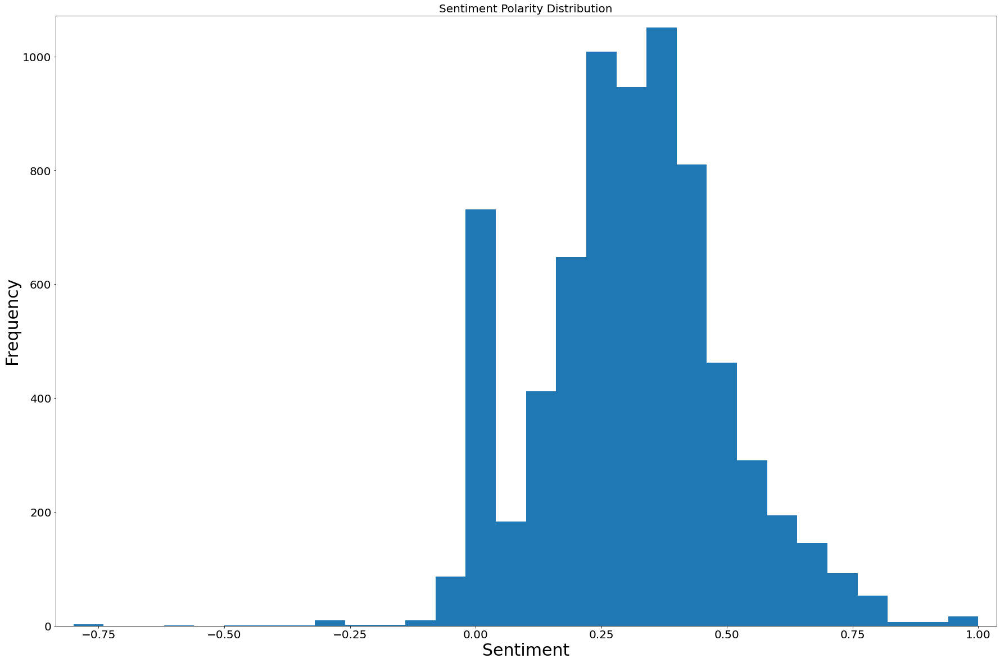

In [15]:
#Show distribution of sentiments based on polarity score

plt.figure(figsize=(30,20))
plt.margins(0.02)

plt.xlabel('Sentiment', fontsize=30)
plt.xticks(fontsize=20)
plt.ylabel('Frequency', fontsize=30)
plt.yticks(fontsize=20)

plt.hist(courses['comments_score'], bins=30)
plt.title('Sentiment Polarity Distribution', fontsize=20)
plt.show()

In [16]:
courses.dropna(subset = ['rating'], inplace=True)

In [17]:
#Round up ratings
courses['rating_round'] = courses['rating'].apply(lambda x: int(int(x)) if x == x else "")

In [18]:
index_names = courses [courses ['rating_round'] == 0].index
courses.drop(index_names, inplace = True)  
courses 

,Unnamed: 0.1,duration,title,rating,student,difficulty,link,site,skill,comments,comments_score,price,sentiment,review_len,word_count,rating_round
0,0,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive,44,7,3
1,1,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive,44,7,3
2,2,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive,44,7,3
3,3,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive,44,7,3
4,4,4.0,Business intelligence and data warehousing,3.862069,9373.0,Intermediate,https://www.coursera.org/learn/business-intell...,cousera,snowflake,course great hoping others learn great stuff,0.800000,$39 subscription fee per month,positive,44,7,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14885,14885,2.5,Watercolor paint fun & easy GREETING CARDS for...,4.300000,1201.0,NaN,https://www.udemy.com/course/paint-quick-fun-g...,udemy,snowflake,Well spoken and demonstrate d so quick and ...,0.496121,12.99,positive,1427,268,4
14887,14887,2.5,How to Draw Step by Step for Kids and Beginners,4.450000,14066.0,NaN,https://www.udemy.com/course/how-to-draw-step-...,udemy,snowflake,The instructor speaks clearly and gives...,0.290909,12.99,positive,420,57,4
14892,14892,4.0,Data Warehouse Development Process,4.350000,11095.0,NaN,https://www.udemy.com/course/data-warehouse-de...,udemy,snowflake,It's a bit fast to understand Was a g...,0.255072,12.99,positive,1071,168,4
14894,14894,6.0,Data Warehousing for beginners.,3.700000,14153.0,NaN,https://www.udemy.com/course/data-warehousing-...,udemy,snowflake,Good - what I expected - each lecture was o...,0.283365,12.99,positive,928,159,3


Text(0.5, 1.0, 'Rating Distribution')

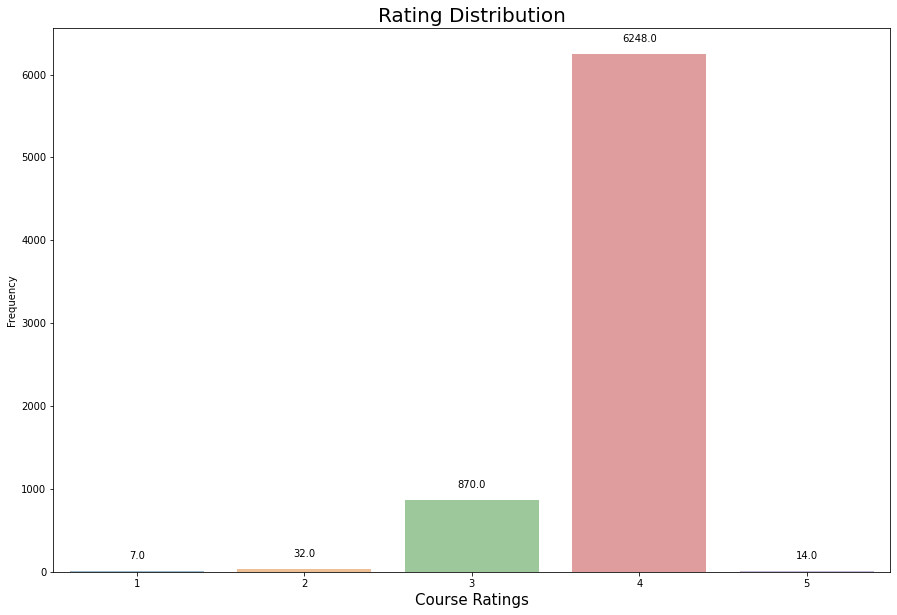

In [19]:
#Show distribution of course ratings

plt.figure(figsize=(15,10))
x_rating = courses.rating_round.value_counts()
# y_rating = x_rating.sort_index()
splot = sns.barplot(x_rating.index, x_rating.values, alpha=0.5)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 15), 
                   textcoords = 'offset points')

plt.xlabel('Course Ratings', fontsize=15)
plt.xticks(fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.yticks(fontsize=10)

plt.title("Rating Distribution", fontsize=20)

In [20]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [21]:
courses.columns

Index(['Unnamed: 0.1', 'duration', 'title', 'rating', 'student', 'difficulty',
       'link', 'site', 'skill', 'comments', 'comments_score', 'price',
       'sentiment', 'review_len', 'word_count', 'rating_round'],
      dtype='object')

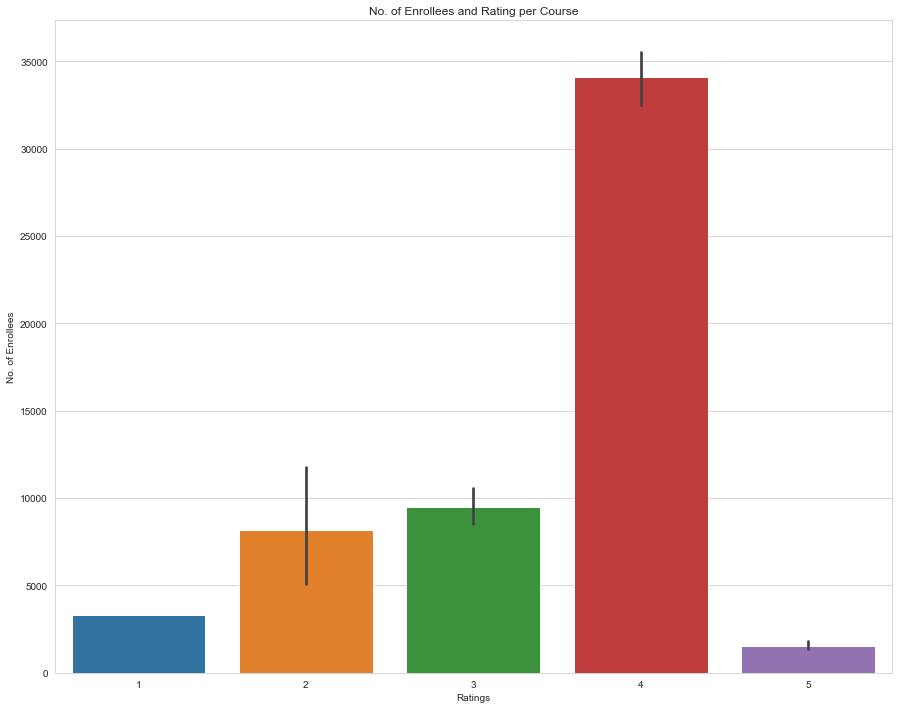

In [22]:
plt.figure(figsize=(15, 12))
sns.set_style('whitegrid')
sns.barplot(x='rating_round', y='student', data=courses)
plt.xlabel("Ratings")
plt.ylabel("No. of Enrollees")
plt.title("No. of Enrollees and Rating per Course")
plt.show()

In [23]:
interval = alt.selection_interval()

chart = alt.Chart(courses).mark_bar().encode(
    x=alt.X('rating_round'),
    y=alt.Y('student'),
    color = alt.condition(interval,'rating_round',alt.value('blue'))
).properties(selection = interval)

chart

alt.Chart(...)

In [ ]:
plt.figure(figsize=(15, 12))
sns.set_style('whitegrid')
sns.swarmplot(x='rating_round', y='student', data=courses)
plt.xlabel("Ratings")
plt.ylabel("No. of Enrollees")
plt.title("No. of Enrollees and Rating per Course")
plt.show()

In [26]:
#Rating and Duration (Altair)
interval = alt.selection_interval()

chart = alt.Chart(courses).mark_bar().encode(
    x=alt.X('rating_round'),
    y=alt.Y('duration'),
).properties(selection = interval)

chart

alt.Chart(...)

In [ ]:
###Others

In [ ]:
#Letter average of reviews

letter_avg = courses.groupby('rating_round')['review_len'].mean().plot(kind='bar', figsize=(30,20))
plt.xlabel('Rating', fontsize=25)
plt.ylabel('Count of Letters in Rating', fontsize=25)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.title('Average Number of Letters per Rating Distribution', fontsize=30)
plt.show()

In [ ]:
#Word average of reviews

word_avg = courses.groupby('rating_round')['word_count'].mean().plot(kind='bar', figsize=(30,20))
plt.xlabel('Rating', fontsize=25)
plt.ylabel('Count of Words in Rating', fontsize=25)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.title('Average Number of Words per Rating Distribution', fontsize=30)
plt.show()

In [ ]:
#Correlation Matrix

correlation = courses[['rating','comments_score', 'review_len', 'word_count']].corr()
mask = np.zeros_like(correlation, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10,7))
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
sns.heatmap(correlation, cmap='coolwarm', annot=True, annot_kws={"size": 15}, linewidths=10, vmin=-1.5, mask=mask)